# Identification
Please indicate your name

Student 1: Erisa Kohansal

Student 2: Sama Satariyan

# Practical work 6 : Harris Corner Detector

The goal of this pratical work is to implement the Harris-Stephen's corners detector (C. Harris and M. Stephens. A combined corner and edge detector. In Proc. Fourth Alvey Vision Conference, pages 147–151, 1988).

Recall the Harris detector computes a map of corners from an image $I$:
$$
R(x,y) = \operatorname{det}(M) - k (\operatorname{trace}(M))^2, (x,y) \text{pixels}
$$
with $k\in[0.04, 0.06]$. $M$ is the auto-correlation of image $I$:
$$
M=\begin{pmatrix}
\sum_{x,y \in W} w(x,y)I_x^2 &
\sum_{x,y \in W} w(x,y)I_xI_y \\
\sum_{x,y \in W} w(x,y)I_xI_y &
\sum_{x,y \in W} w(x,y)I_y^2 
\end{pmatrix}
=\begin{pmatrix}
A & B \\ C & D
\end{pmatrix}
$$
with $w(x,y)=\frac1{2\pi \sigma^2}e^{\frac{(x-x_c)^2 + (y-y_c)^2}{2\sigma^2}}$ a Gaussian mask centered on the window $W$. Partial derivatives $I_x$ and $I_y$ are estimated by one of the following kernels :
- Gradient:  $G_x = \begin{pmatrix} 0 & 0 & 0\\ 1 & 0 &-1 \\ 0 & 0 & 0 \end{pmatrix}$,
 $G_y = G_x^T$
- Prewitt: $G_x = \begin{pmatrix} 1 & 0 & -1\\ 1 & 0 &-1 \\ 1 & 0 & -1 \end{pmatrix}$,
 $G_y = G_x^T$
- Sobel: $G_x = \begin{pmatrix} 1 & 0 & -1\\ 2 & 0 &-2 \\ 1 & 0 & -1 \end{pmatrix}$,
 $G_y = G_x^T$
 


In [1]:
# Load useful libraries
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal

# Useful functions 
def gaussianKernel(sigma):
    """ double -> Array
        return a gaussian kernel of standard deviation sigma
    """
    n2 = int(np.ceil(3*sigma))
    x,y = np.meshgrid(np.arange(-n2,n2+1),np.arange(-n2,n2+1))
    kern = np.exp(-(x**2+y**2)/(2*sigma*sigma))
    return  kern/kern.sum()

def niceDisplay14(affichages,titres=None):
    """ list[Array]*list[str] -> NoneType
        display from 1 up to 4 images or vectors with optionnal titles
        2D arrays are displayed as image with imshow()
        1D arrays are displayed as curve with plot()
    """
    if not type(affichages) == type([]):
        affichages = [affichages]
        
    if titres is None:
        titres = ['',]*len(affichages)
        
    if not type(titres) == type([]):
        titres = [titres]
    
    nb_affichages = len(affichages)
    if nb_affichages >4 or nb_affichages < 1 :
        raise ValueError('niceDisplay_14 : affichage should be a list of length 1 up to 4')
        
    if nb_affichages != len(titres):
        raise ValueError('niceDisplay_14 : titres must have same length than affichage')
        
    courbes = False
    for i in range(0,nb_affichages):
        s = plt.subplot(101+10*nb_affichages+i)
        s.set_title(titres[i])
        if len(affichages[i].shape)==2 and affichages[i].shape[0] > 1 and affichages[i].shape[1] > 1:
            # on affiche une image
            s.imshow(affichages[i], cmap="gray",interpolation='nearest', aspect='equal')
            s.set_xticks(())
            s.set_yticks(())
        else :
            # il s'agit d'une seule ligne, à afficher comme une courbe
            plt.plot(affichages[i])
            plt.xticks(())
            plt.yticks(())
            courbes=True

    agrandissement_h = nb_affichages
    agrandissement_v = nb_affichages*2 if courbes else nb_affichages
    params = plt.gcf()
    plSize = params.get_size_inches()
    params.set_size_inches( (plSize[0]*agrandissement_v, plSize[1]*agrandissement_h) )
    plt.show()


## Exercise 1: Harris response calculation

1) Write a function `computeR(I, scale, kappa)` that returns the Harris response $R$ from an image $I$ and a scale $scale$. You will use 5 steps:
- Computation of the directionnal derivate $I_x$ and $I_y$. Use the Sobel kernel.
- Computation of the products $I_x^2$, $I_y^2$, $I_x.I_y$.
- Computation of the convolution of $I_x^2$, $I_y^2$ and $I_x.I_y$ by a gaussian kernel of size N (use given function `gaussianKernel()`)
- Computation of $\operatorname{det}(M(x,y))$ and $\operatorname{trace}(M(x,y))$ for each pixel
- Computation of $R(x,y) = \operatorname{det}(M(x,y)) - k.(\operatorname{trace}(M(x,y)))^2$. You can use $k = 0.04$.

 You can compute the convolutions by using the ```scipy.signal.convolve2d``` function. 


In [2]:
def computeR(image,scale,kappa):
    """ Array[n, m]*float*float->Array[n, m]
    """
    from scipy.signal import convolve2d
    Sx = np.array([[1,0,-1],[2,0,-2],[1,0,-1]])
    Sy = Sx.T
    Ix = convolve2d(image, Sx, boundary='symm', mode='same')
    Iy = convolve2d(image, Sy, boundary='symm', mode='same')

    Ix2, Ixy, Iy2 = Ix*Ix, Ix*Iy, Iy*Iy
    gauss = gaussianKernel((scale-1)/6)

    convIx2 = convolve2d(Ix2, gauss, mode='same')
    convIxy = convolve2d(Ixy, gauss, mode='same')
    convIy2 = convolve2d(Iy2, gauss, mode='same')

    detM = convIx2*convIy2 - convIxy*convIxy
    trM = convIx2+convIy2
    
    return detM - kappa*(trM*trM)

Réponse de Harris : 
$$R_I(\sigma) = g_\sigma \ast \begin{pmatrix} I_x^2 & I_x I_y \\ I_x I_y & I_y^2 \end{pmatrix}$$

REMARQUE : $R$ est la réponse de Harris qui est calculé à partir de la matrice d'auto-corrélation $M$.

2) Write a script that displays the Harris response for the image ```img/house2.png``` along with the original image. Use a gaussian window of size $W=15$ pixels.

Pour un $W=15$, nous avons besoin d'un $\sigma$:
$$15 = 2 \times \lceil 3\sigma \rceil + 1$$
$$\sigma \in (2,\frac{7}{3}]$$

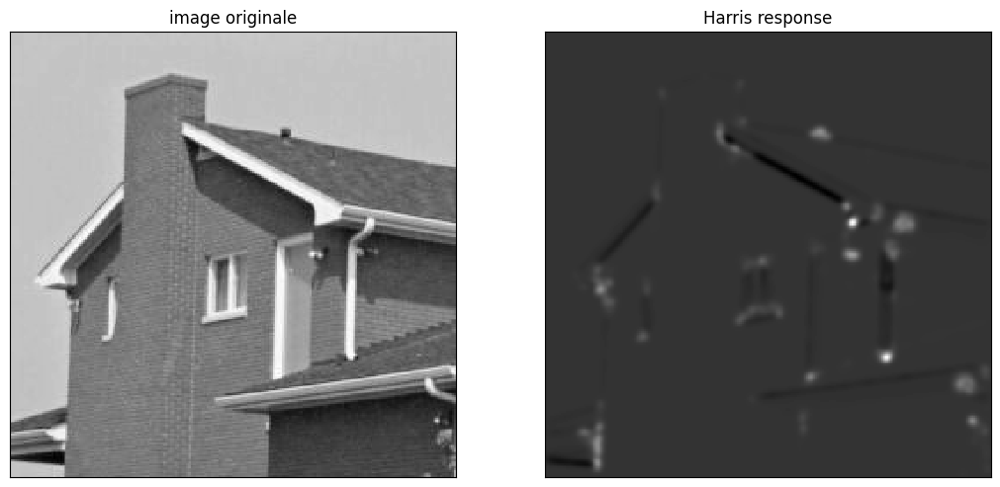

(np.float64(-805455063.3094708), np.float64(3204986680.1165705))

In [3]:
house2 = np.array(Image.open('img/house2.png'))
R_house2 = computeR(house2, 15, 0.04)

niceDisplay14([house2, R_house2], ["image originale", "Harris response"])
assert house2.shape == R_house2.shape
np.min(R_house2), np.max(R_house2)

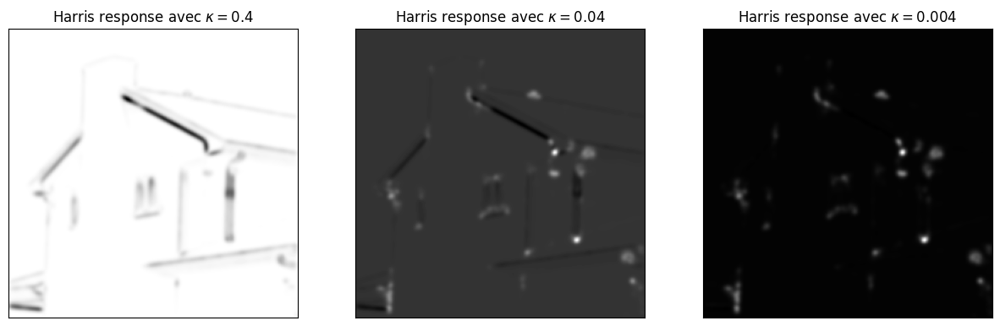

In [4]:
# test des valeurs de kappa
kappas = [0.4, 0.04, 0.004]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15,8))
for i in range(len(kappas)):
    ax[i].imshow(computeR(house2, 15, kappas[i]), cmap="gray")
    ax[i].set_title("Harris response avec $\kappa=${:}".format(kappas[i]))
    ax[i].set_xticks(())
    ax[i].set_yticks(())
plt.show()

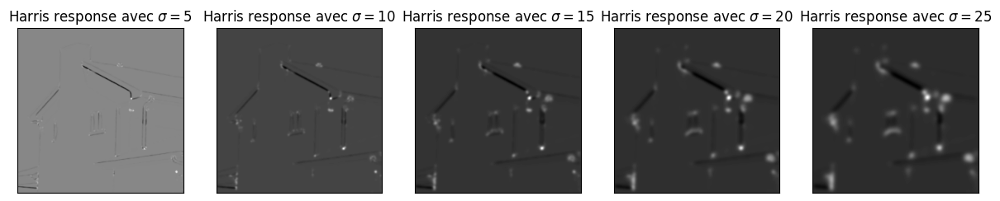

In [5]:
# test des valeurs de sigma (window)
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(15,8))
for W in range(5, 26, 5):
    i = W//5-1
    ax[i].imshow(computeR(house2, W, 0.04), cmap="gray")
    ax[i].set_title("Harris response avec $\sigma=${:}".format(W))
    ax[i].set_xticks(())
    ax[i].set_yticks(())
plt.show()

3) Write in a few lines an interpretation of the results, explaining how the Harris response allows to detect and discriminate homogeneous areas, edges and corners.

Nous avons trois configurations possibles pour la réponse de Harris $R(x,y)$: 
- $R(x,y) > 0 $: changement significatif d'intensité dans toutes les directions, caractéristique des coins. Ces zones sont identifiées par des tâches blanches. Dans ce cas, il n'existe aucune valeur propre nulle, car les deux valeurs propres $\lambda _1$ et $\lambda _2$ sont grandes ce qui rend le $det(M(x,y))$ élevé et le $trace(M(x,y))$ également élevé, donc $\exist \kappa >0$ tel que cette condition soit respectée.

- $|R(x,y)| \approx 0$ : ce sont des zones uniformes(homogènes) avec peu ou pas de variations d'intensité représentées par des nuances de gris, avec des valeurs propres $\lambda _1$ et $\lambda _2$ proches de zéro. On a donc $det(M(x,y)) \approx 0$ et $trace(M(x,y)) \approx 0$.

- $R(x,y) < 0$ : une valeur propre est grande et l'autre est petite ($\lambda _1 >> \lambda _2$ ou l'inverse), ce qui correspond aux contours. Il s'agit de lignes noires où le changement se fait dans une seule direction. Dans ce cas $det(M(x,y)) << trace(M(x,y))$ avec $trace(M(x,y))> 0$.

REMARQUE 1 : Les valeurs propres déterminent la variation dans chaque direction principale. Dans notre cas, les valeurs propres vont déterminer la variation totale des gradients de l'image dans toutes les directions.

REMARQUE 2 : le calcul direct des valeurs propres est computationnellement coûteux. C'est pourquoi on utilise une approximation basée sur certaine propriété des matrices en algèbre linéaire afin de simplifier les calculs, appelée la réponse de Harris, qui ne calcul que les gradients de l'image : 
$$R=det(M)-\kappa trace(M)^2$$ 
où 

$$det(M) = \lambda _1 \lambda _2, trace(M) = \lambda _1 + \lambda _2$$

avec $\lambda _1$ et $\lambda _2$ désignant les deux valeurs propres de la matrice $M$.

REMARQUE 3 : Nous observons que les quatre coins de l'image sont reconnus comme des coins. Pour éviter cela, il faut effectuer un padding symmétrique lors du calcul des gradients de l'image.

Un hyperparamètre est un paramètre qui contrôle le comportement d'un algorithme ou d'un modèle. Donc, $\kappa$ et $\sigma$ sont des hyperparamètre de la réponse de Harris car ils influencent la détection des coins. Par la suite, nous allons analyser les effets de ces deux hyperparamètres sur les résultats obtenus:

- $\kappa$ est un hyperparamètre qui détermine le degré de la sensibilité(= degré de rigueur dans la reconnaissance des coins) aux coins. Plus $\kappa$ est grand, plus la valeur de $R$ diminue. Plus $\kappa$ est petit, plus $R$ augmente. En effet, lorsque $\kappa=0.4$, même les zones homogènes sont considérées comme des coins puisque ces zones, ainsi que les coins apparaissent maintenant en blanc, les contours restent bien distingués des coins(=coins+zones homogènes) sous forme des lignes noires. De plus il semble que la qualité de ces contours restent la même que dans le cas de $\kappa=0.04$. En revanche lorsque $\kappa=0.004$, les zones homogènes et les contours ne peuvent pas être distingués car ils sont tous détectés comme des contours, en déduisant du fait qu'ils sont tous représentés en noir. Mais nous arrivons également à voir des tâches blanches dans le résultat obtenu qui désignent les coins, et la qualité de ces tâches semblent être la même que dans le cas de $\kappa=0.04$ qui est la valeur recommandée de $\kappa$ dans l'énoncé. En général, on choisit la valeur de $\kappa \in [0.04;0.06]$. En effet, avec $\kappa=0.04$, nous arrivons à bien distinguer les coins, les zones homogènes et les contours.

- $\sigma$ est un hyperparamètre qui détermine le degré de visibilité et la précision des coins. Plus la fenêtre gaussienne est grande(donc plus la valeur de $\sigma$ est élevée), plus l'image devient floue et en conséquence plus les coins s'élargissent dans l'image. Or, cela les rend de plus en plus visible. Mais avec une valeur de fenêtre gaussienne très élevée les coins risquent de se mélanger et la distinction de ceux-ci devient compliqué.
Comme nous observons dans les tests, avec un $W=5,(\sigma \in (\frac{1}{3}; \frac{2}{3}])$, les coins ne sont pas tous détectés et même si ils le sont, nous avons du mal à les distinguer des zones homogènes. Alors que dans le cas de $W=25,(\sigma \in (\frac{11}{3}; 4])$, les coins semblent tous être détéctés, mais ils se mélangent à cause du fait que l'image est devenue plus floue qu'il ne soit nécessaire résultant en une précision réduite. Nous remarquons alors que la valeur de $W=15,(\sigma \in (2; \frac{7}{3}])$ donné par l'énoncé est la valeur qui est le meilleur équilibre entre précision et visibilité des coins.



## Exercise 2 : Harris corner detector
From the Harris response calculated at exercise 1, we will write all the functions needed for the Harris detector. Write the following functions: 

1) A function `thresholdR(R, thres)` that calculates and returns the binary thresholding $R_b$ of the response $R$ according to the threshold $thres$

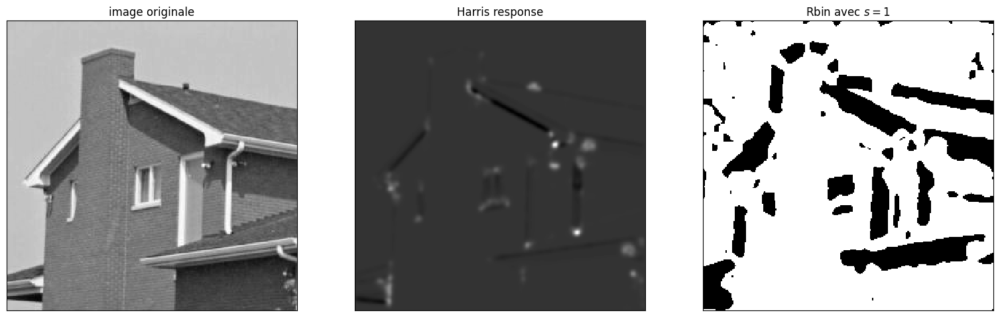

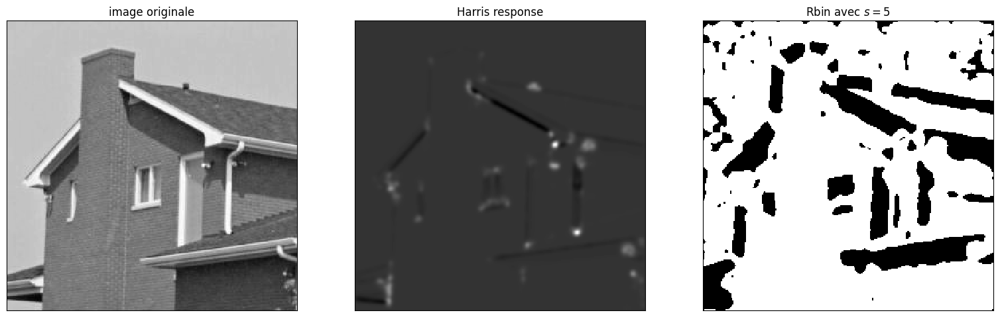

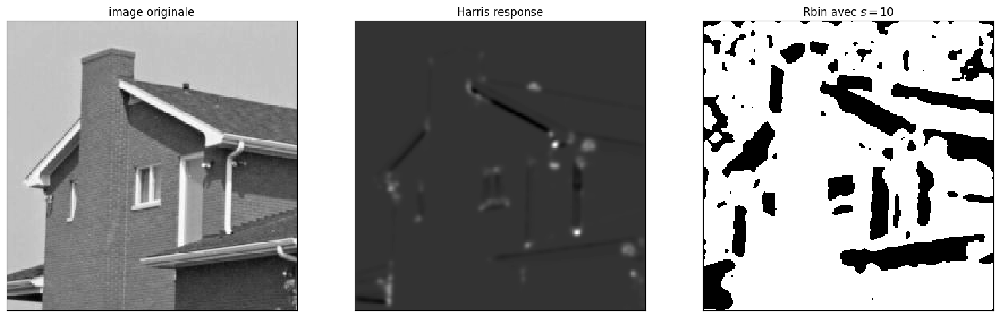

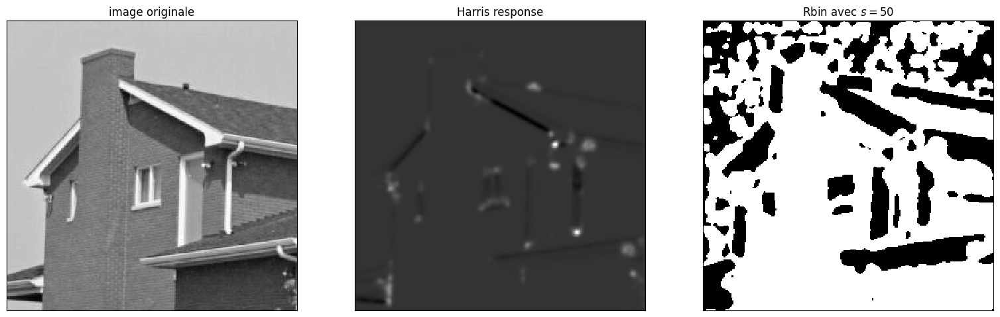

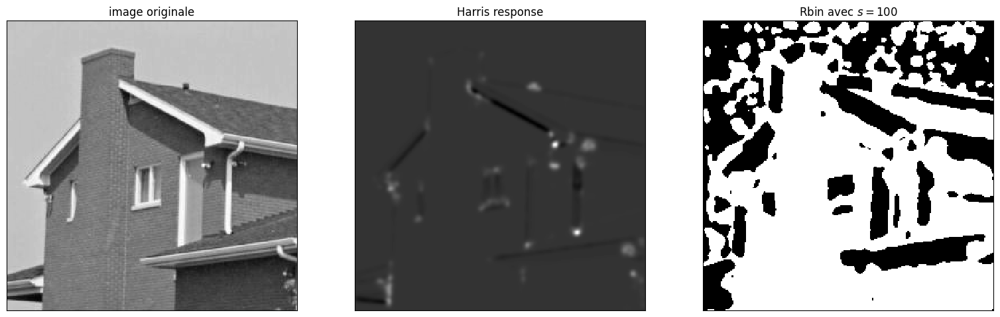

...

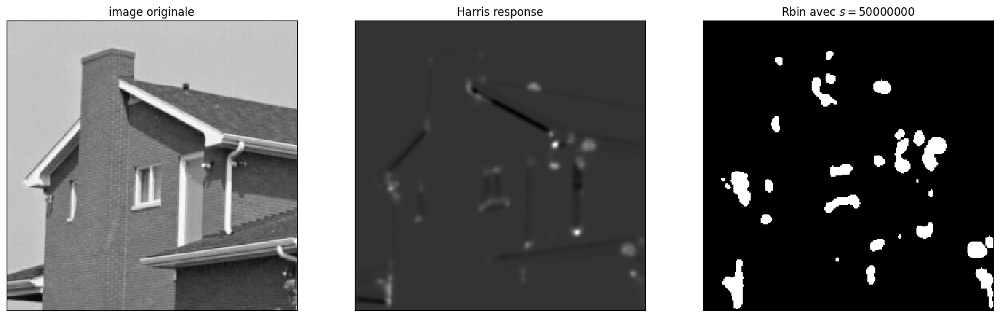

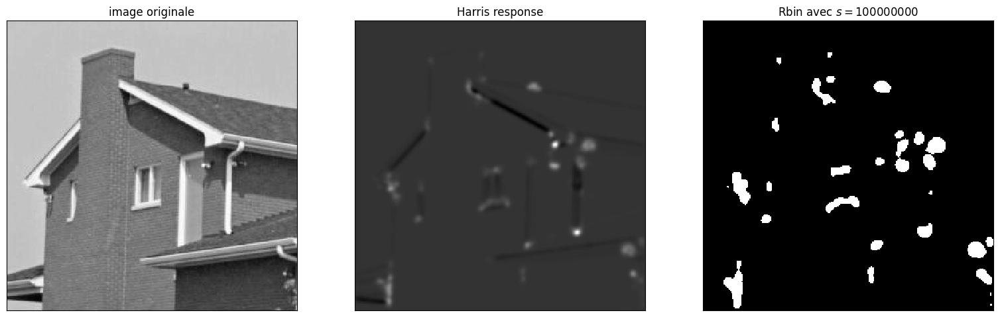

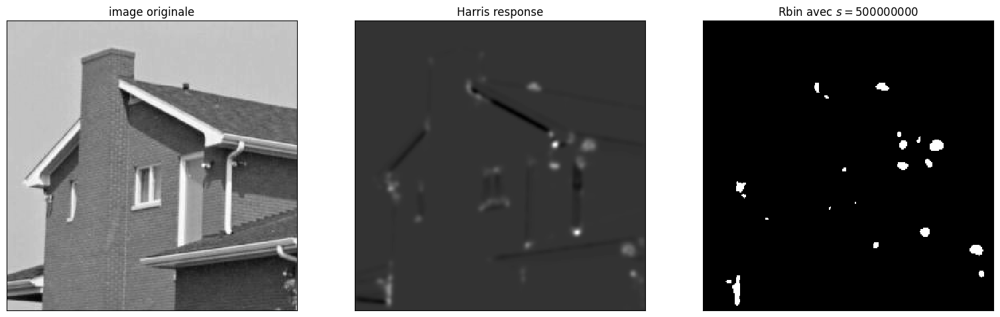

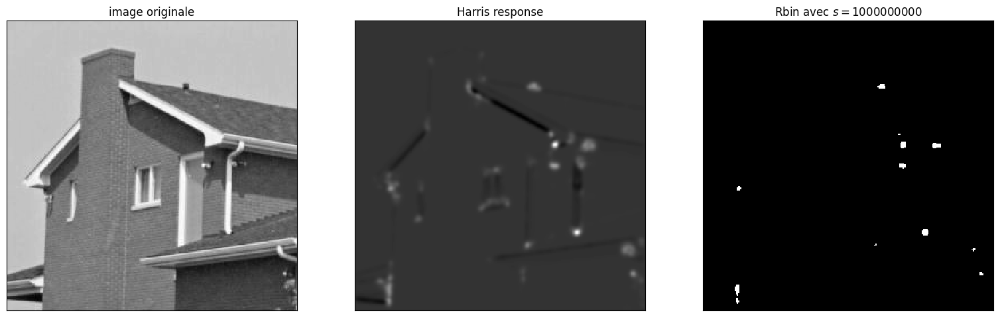

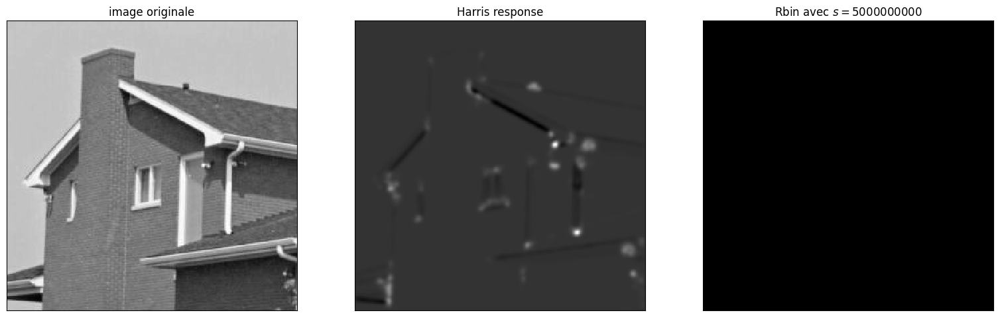

In [6]:
def thresholdR(R, thres):
    """ Array[n, m] * float -> Array[n, m]
    """
    return R>=thres

for threshold in range(10):
    # s = 100 000 000 le meilleur, les blobs de Rbin se correspondent avec ceux de Harris response
    niceDisplay14([house2, R_house2, thresholdR(R_house2, 10**threshold)], ["image originale", "Harris response", "Rbin avec $s=${:}".format(10**threshold)])
    niceDisplay14([house2, R_house2, thresholdR(R_house2, 5*10**threshold)], ["image originale", "Harris response", "Rbin avec $s=${:}".format(5*10**threshold)])

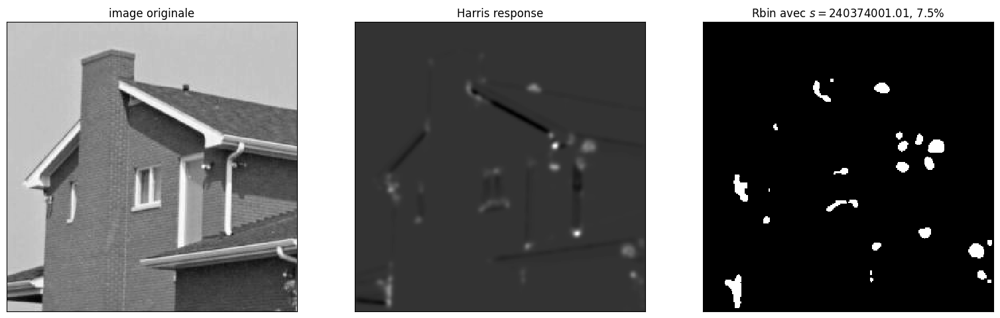

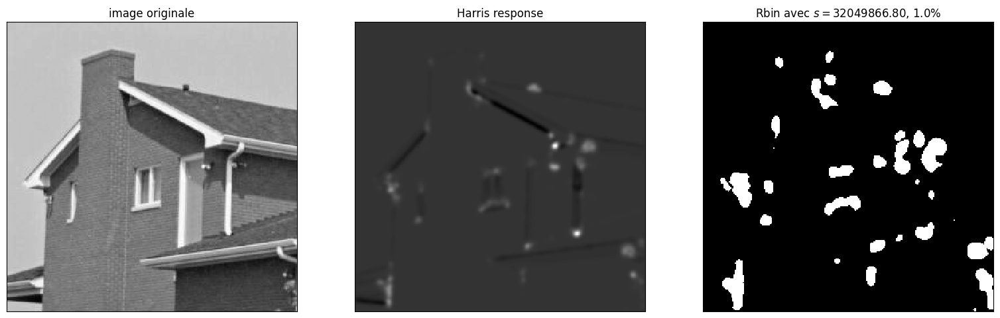

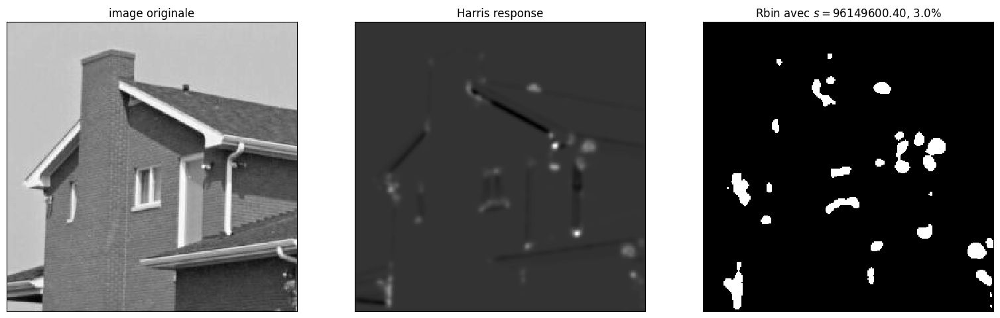

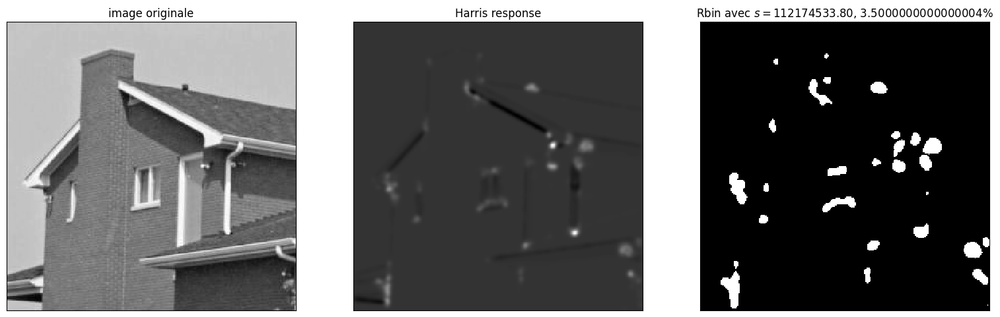

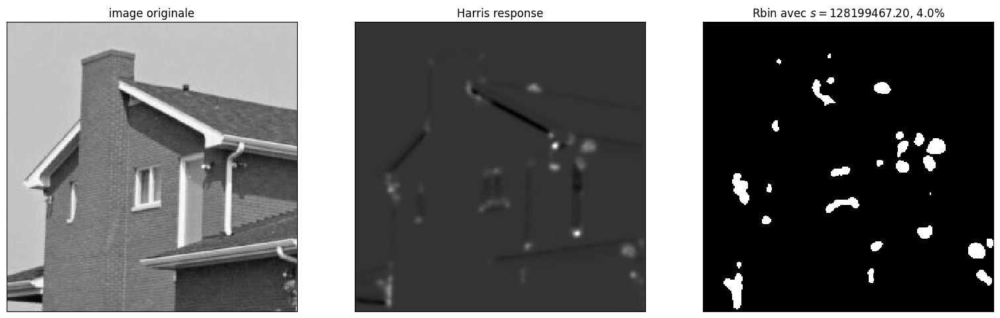

...

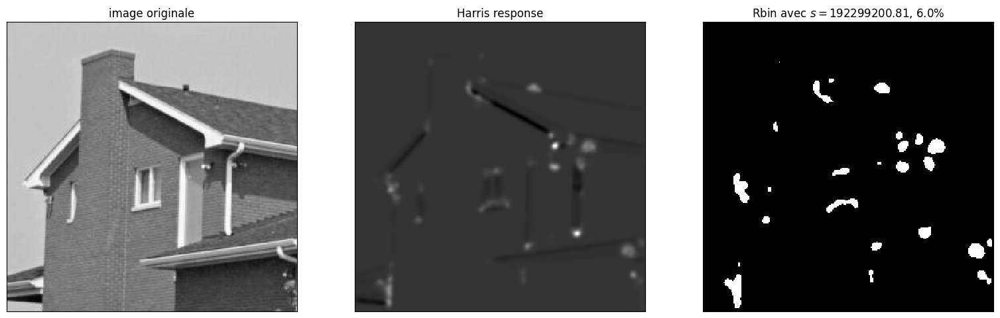

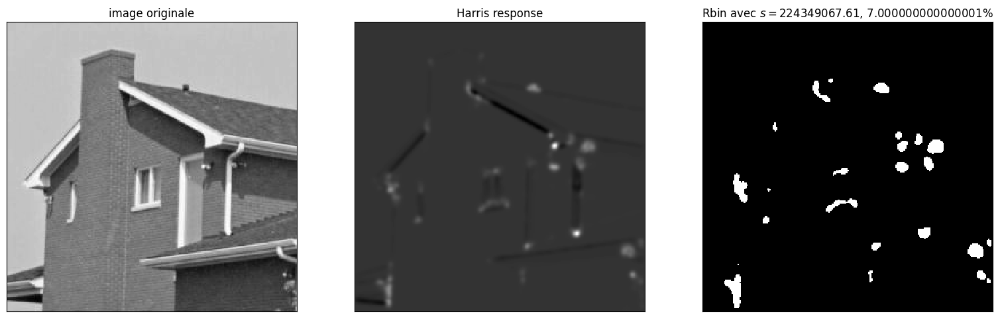

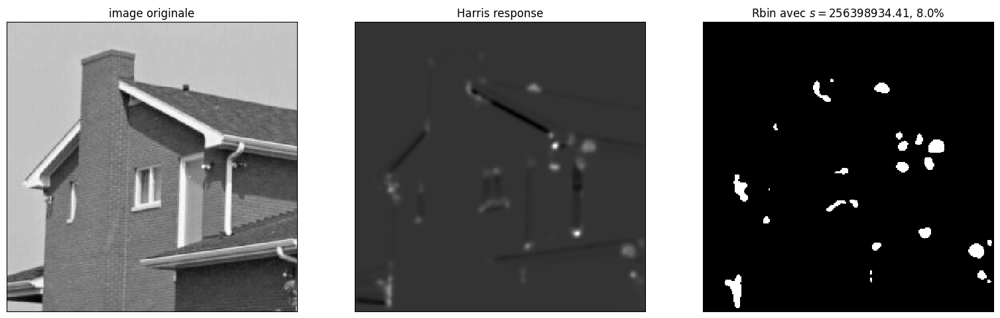

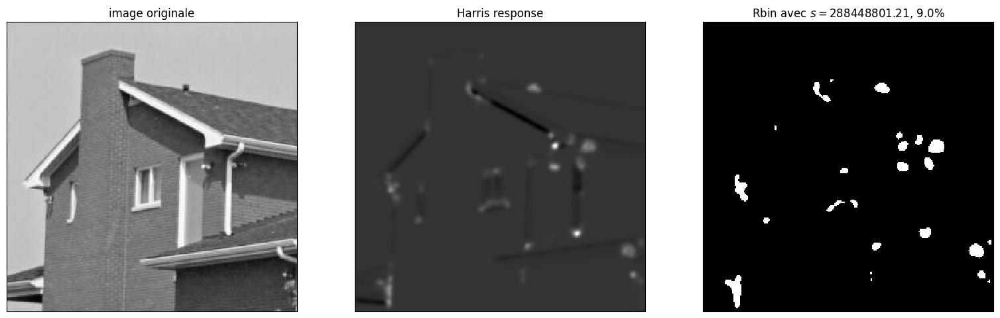

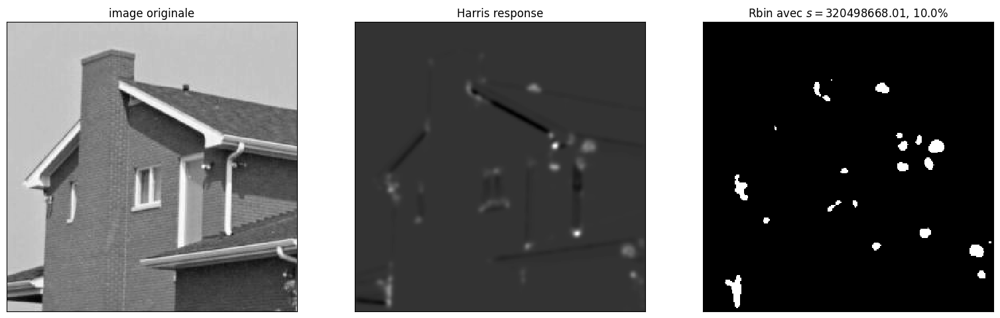

In [26]:
for s in [0.075, 0.01, 0.03, 0.035, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]:
    niceDisplay14([house2, R_house2, thresholdR(R_house2, s*R_house2.max())], ["image originale", "Harris response", "Rbin avec $s=${:.2f}, {:}%".format(s*R_house2.max(), s*100)])

In [27]:
print(0.035*R_house2.max())
print(0.05*R_house2.max())
print(0.03*R_house2.max())

112174533.80407998
160249334.00582853
96149600.40349711


La meilleure valeur de Threshold semble être $s=100, 000, 000$ car entre l'image seuillée et l'image de la réponse de Harris, nous observons le plus de cohérence entre les coins détéctés.

Une autre méthode s'agit d'utiliser un seuil basé sur un pourcentage de la valeur maximale de la réponse de Harris $R$. Par exemple, nous pouvons fixer le seuil à $0.03 \times R_{max}$ signifiant que seuls les pixels dont la réponse de Harris est au moins égale à $3\%$ de la réponse maximale seront considérés comme des coins potentiels. Cependant le choix de pourcentage n'est pas universel et dépend de plusieurs facteurs. D'après les tests effectués sur les pourcentages, nous avons décidé de procéder avec $3\%$ car c'est celui qui correspond le plus à nos attentes pour la détection de coins de cette image.

2) A function `Rnms(R, Rbin)` that performs a non-maximum supression from the response $R$ and the binarized response $R_{bin}$. It returns the image $R_{locmax}$ (same size as $R$) =1 where $R_{bin}=1$ and the pixel has a greater value $R$ than its 8 nearest neighbors.

**Bonus**: Write a faster version of the script using Numpy function `np.roll()`.

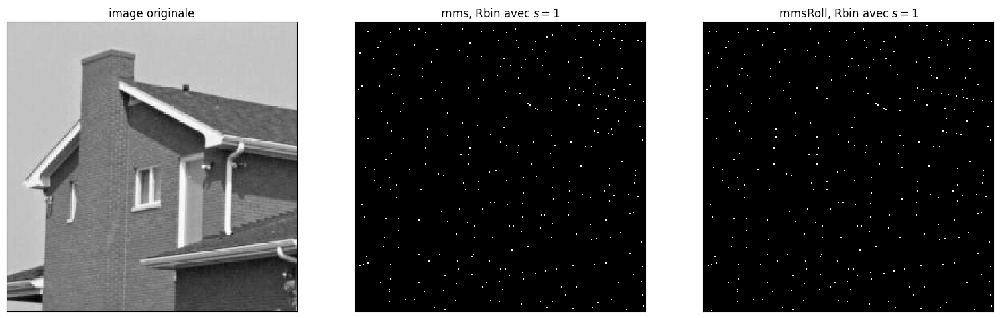

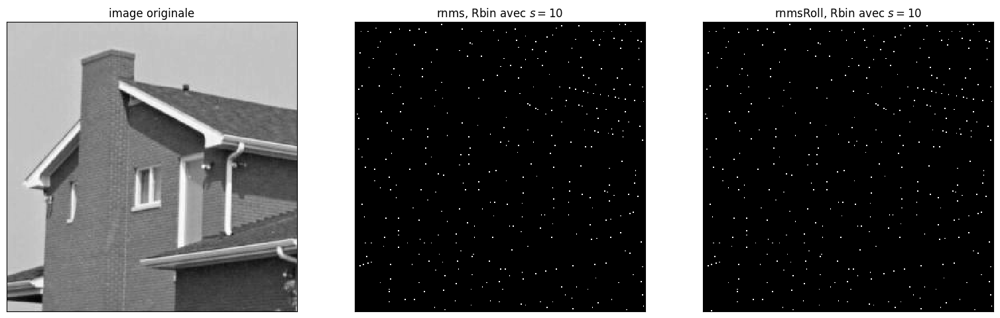

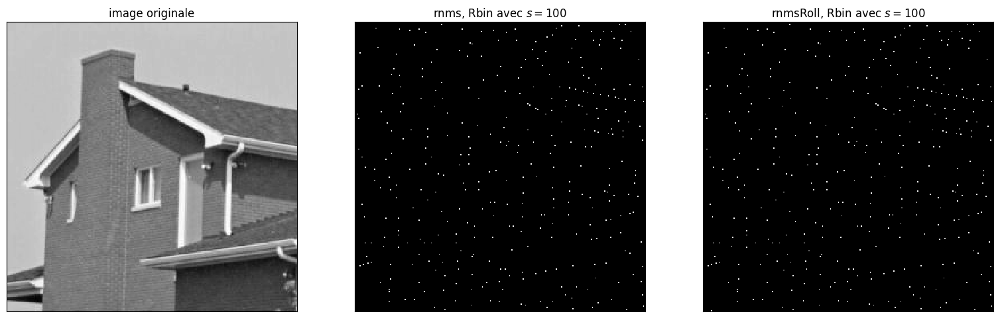

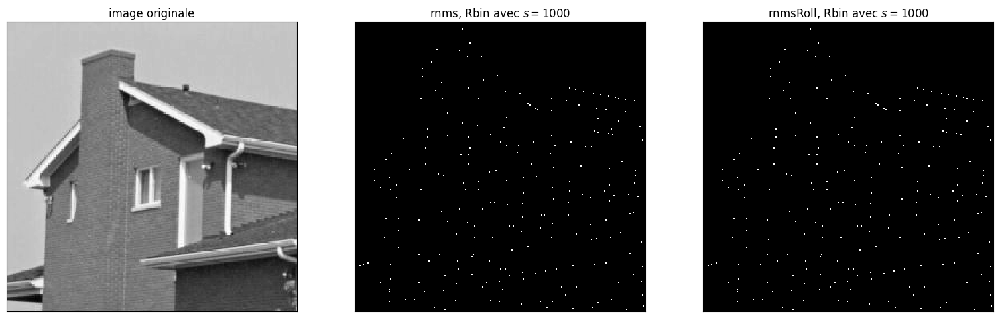

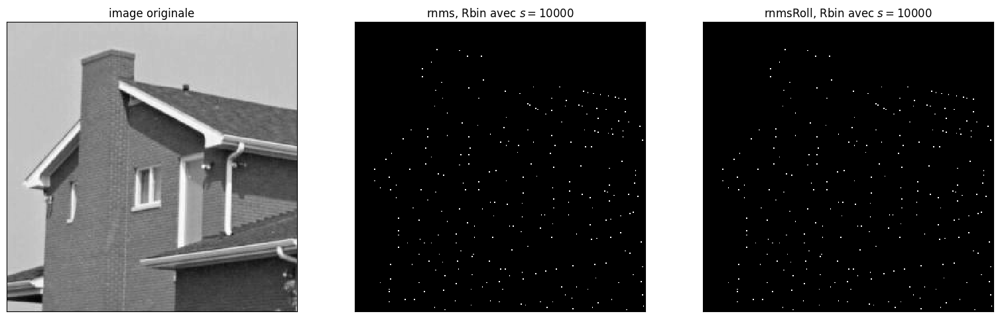

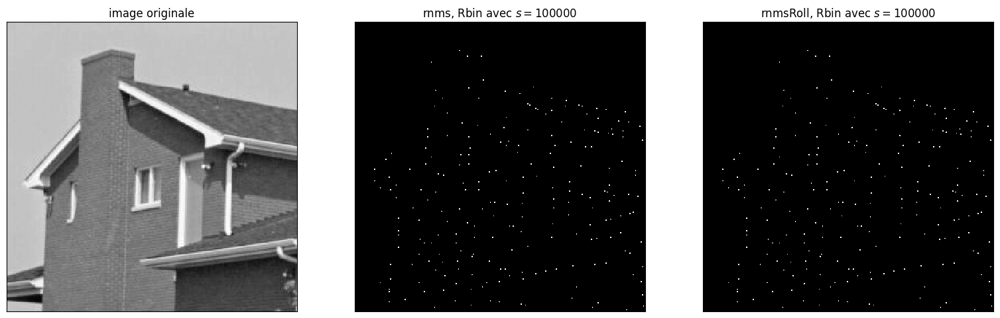

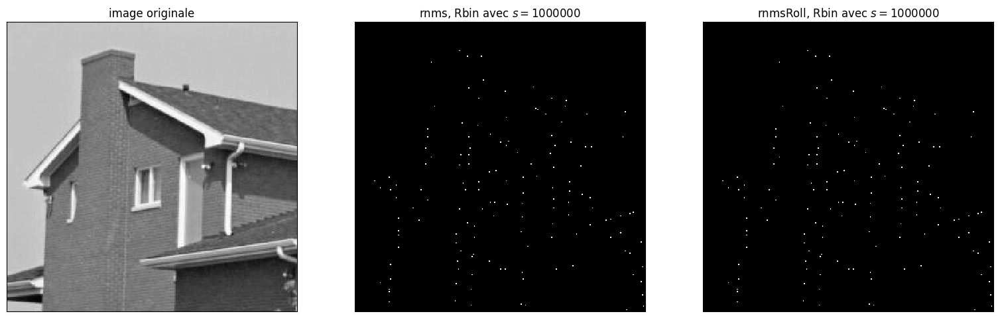

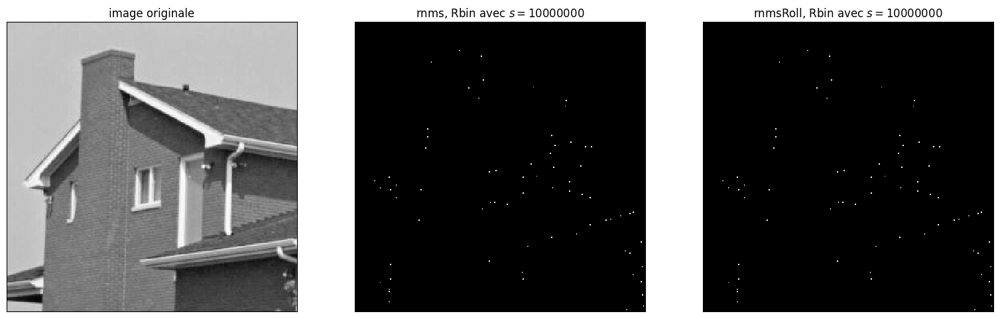

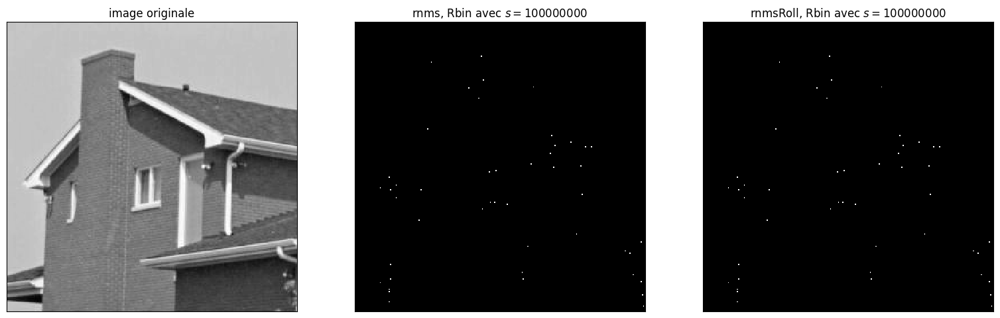

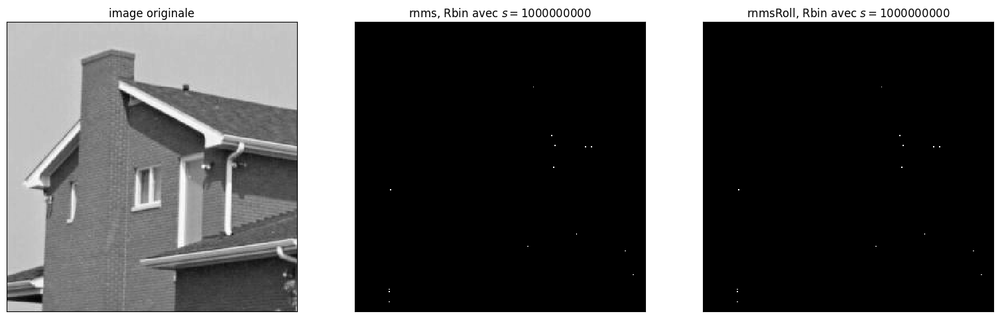

In [9]:
def rnms(R, Rbin):
    """ Array[n, m] -> Array[n, m] 
    """
    n, m = R.shape
    Rlocmax = np.zeros((n,m))
    for i in range(1, n-1):
        for j in range(1, m-1):
            if Rbin[i,j]:
                neighbour = R[i-1:i+2,j-1:j+2]
                if R[i,j] == np.max(neighbour): # on garde des maxima locaux
                    Rlocmax[i,j] = 1
    return Rlocmax

def rnmsRoll(R, Rbin): 
    """ Array[n, m] -> Array[n, m] 
    """
    Rlocmax = np.full(Rbin.shape, fill_value=True)
    for dx, dy in [(-1, -1), (-1, 0), (-1, 1), 
                   (0, -1), (0, 1), 
                   (1, -1), (1, 0), (1, 1)]:
        shift = np.roll(np.roll(R, -dx, axis=0), -dy, axis=1)
        Rlocmax &= (R >= shift)
    
    return Rlocmax & (Rbin == 1)

for threshold in range(10):
    niceDisplay14([house2, rnms(R_house2, thresholdR(R_house2, 10**threshold)), rnmsRoll(R_house2, thresholdR(R_house2, 10**threshold))], ["image originale", "rnms, Rbin avec $s=${:}".format(10**threshold), "rnmsRoll, Rbin avec $s=${:}".format(10**threshold)])

Le principe de ```rnmsRoll``` est de décaler l'image $R$ dans les 8 directions pour obtenir ses 8 voisins plus proche.
 
Nous ne gardons que les pixels pour lesquels $R_{bin}=1$ et pour lesquels leur valeur dans $R$ est strictement supérieure à celle de chacun de leurs voisins décalés.

3) Write a function ``cornerDetector(image, scale, kappa, thresh)`` that returns an array of the same size as the image. The array takes two values: 1 where a corner is detected and 0 elsewhere.

In [34]:
def cornerDetector(image, sigma, kappa, thres=None):
    """ Array[n, m]*float*float*float -> Array[n, m]
    """
    scale = 2*np.ceil(3*sigma)+1
    hR = computeR(image, scale, kappa)
    if thres is None:
        thres = 0.03 * hR.max()
        print(thres)
    Rbin = thresholdR(hR, thres)
    Rlocmax = rnmsRoll(hR, Rbin)
    return Rlocmax

4 ) Display the detected corners on the original image for the image ```img/house2.png```. Each detected corner will be displayed as a small red disk. You can use the functions ```np.nonzero()``` and ```plt.scatter()``` to that purpose.

REMARQUE : ```np.nonzero()``` renvoie les indices des lignes(correspondant à l'axe $y$) en premier, et le deuxième élément du tuple renvoyé contient les indices des colonnes(correspondant à l'axe $x$).

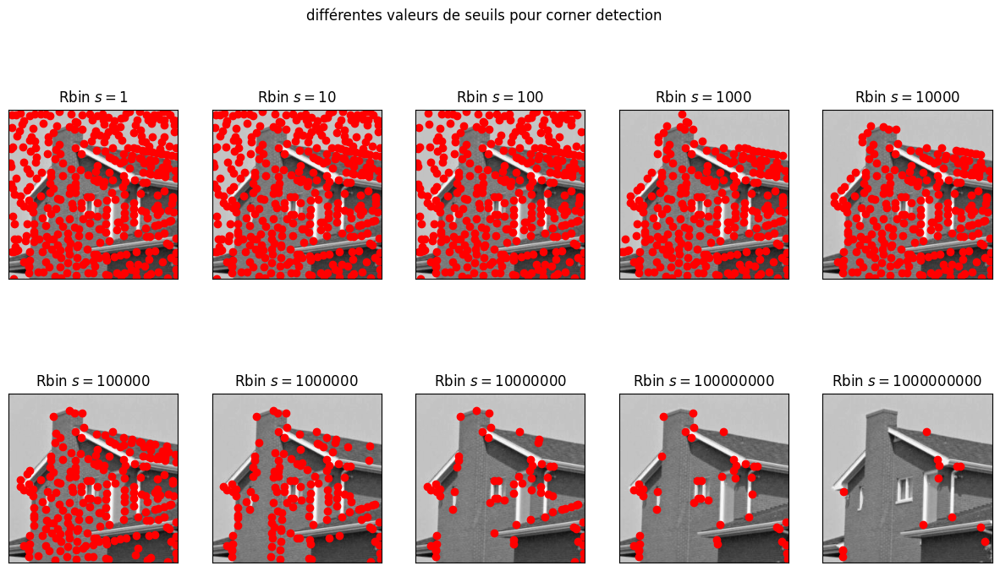

In [11]:
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(15, 8))
fig.suptitle("différentes valeurs de seuils pour corner detection")
for threshold in range(10):
    i = threshold // 5
    j = threshold - 5
    ax[i,j].imshow(house2, cmap="gray")
    ax[i,j].set_title("Rbin $s=${:}".format(10**threshold))
    ax[i,j].set_xticks(())
    ax[i,j].set_yticks(())
    y, x = np.nonzero(cornerDetector(house2, 2.2, 0.04, 10**threshold))
    ax[i,j].scatter(x, y, c='red')

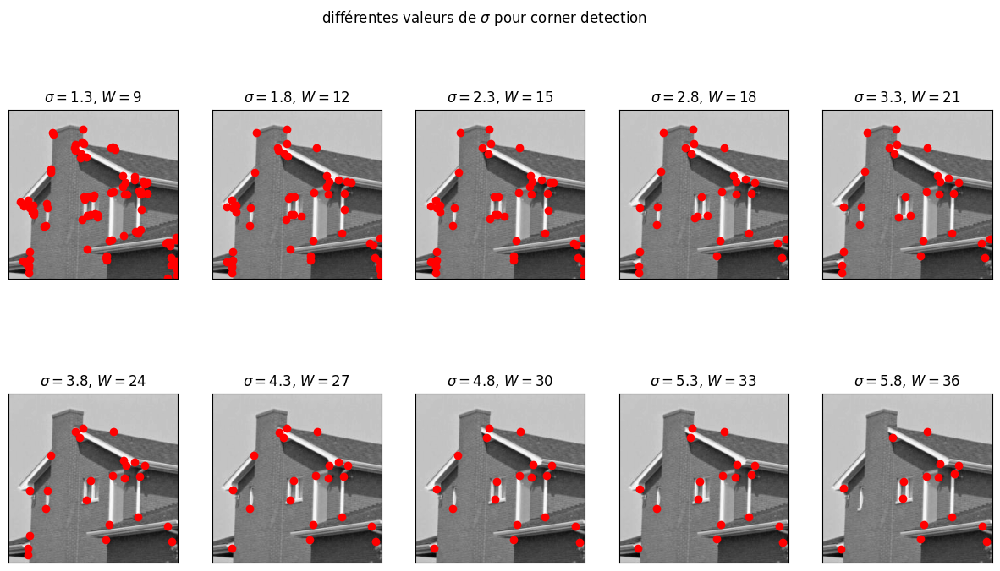

In [12]:
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(15, 8))
fig.suptitle("différentes valeurs de $\sigma$ pour corner detection")
for scale in range(9, 37, 3):
    i = (scale//3-3) // 5
    j = (scale//3-3) % 5
    sigma = (scale-1)/6
    ax[i,j].imshow(house2, cmap="gray")
    ax[i,j].set_title("$\sigma=${:.1f}, $W=${:}".format(sigma, scale))
    ax[i,j].set_xticks(())
    ax[i,j].set_yticks(())
    y, x = np.nonzero(cornerDetector(house2, sigma, 0.04, 10**8))
    ax[i,j].scatter(x, y, c='red')

5) Evaluate the performances of the corner detector. Try to find good values for Sigma and Threshold.

Comme expliqué dans l'exercice précédent, plus nous augmentons la valeur de $\sigma$, plus le détecteur manque de reconnaître des coins. Plus nous diminuons cette valeur, le détecteur reconnaîtra alors des faux coins.

Le même raisonnement s'applique à la valeur du seuil. C'est-à-dire que lorsque cette valeur est très élevée, le détécteur n'arrive pas à reconnaître tous les coins de l'image et à l'inverse quand cette valeur est très petite, le détecteur va alors introduire des faux coins parmi tous les coins reconnus. 

D'après les tests, le meilleur résultat est obtenu lorsque $W=15, \sigma \in (2, \frac{7}{3}]$. Concernant la valeur du seuil, nous avons expliqué dans la question 1 de cet exercice les deux valeurs possibles, soit nous procèdons d'après les approximations vu au cours des tests avec $s=10^8$, soit nous choisisson $s = 0.03 \times R_{max}$. Au delà de cette valeur de $s$, nous allons perdre des coins importants de l'image.

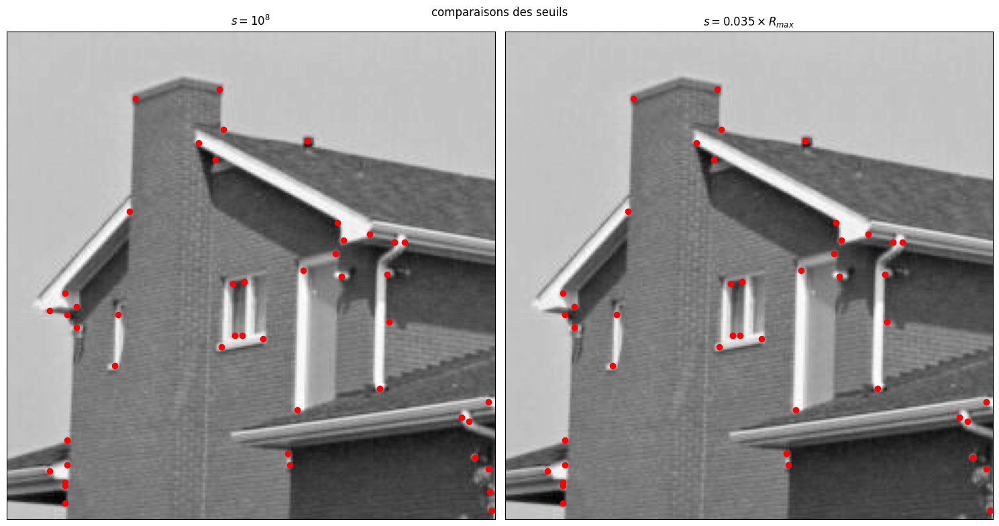

In [ ]:
fig = plt.figure(figsize=(15, 8))
fig.suptitle("comparaisons des seuils")

sub1 = plt.subplot(1, 2, 1)
sub1.imshow(house2, cmap="gray")
sub1.set_title("$s=10^8$")
sub1.set_xticks(())
sub1.set_yticks(())
y, x = np.nonzero(cornerDetector(house2, 2.1, 0.04, 10**8))
sub1.scatter(x, y, c='red')

sub2 = plt.subplot(1, 2, 2)
sub2.imshow(house2, cmap="gray")
sub2.set_title("$s=0.035 \\times R_{max}$")
sub2.set_xticks(())
sub2.set_yticks(())

R = computeR(house2, 15, 0.04)
Rbin = thresholdR(R, 0.03*R.max())
Rlocmax = rnmsRoll(R, Rbin)
y, x = np.nonzero(Rlocmax)
sub2.scatter(x, y, c='red')

fig.tight_layout()
plt.show()

## Exercise 3 : Properties of Harris corner detector

The goal of this exercice is to study some invariance properties of Harris detector.

1) Write a script that detects the corners on the images ```img/toyHorse1.png``` and ```img/toyHorse2.png``` with a scale of 15 and appropriate threshold value. Display the detected corners on the images.

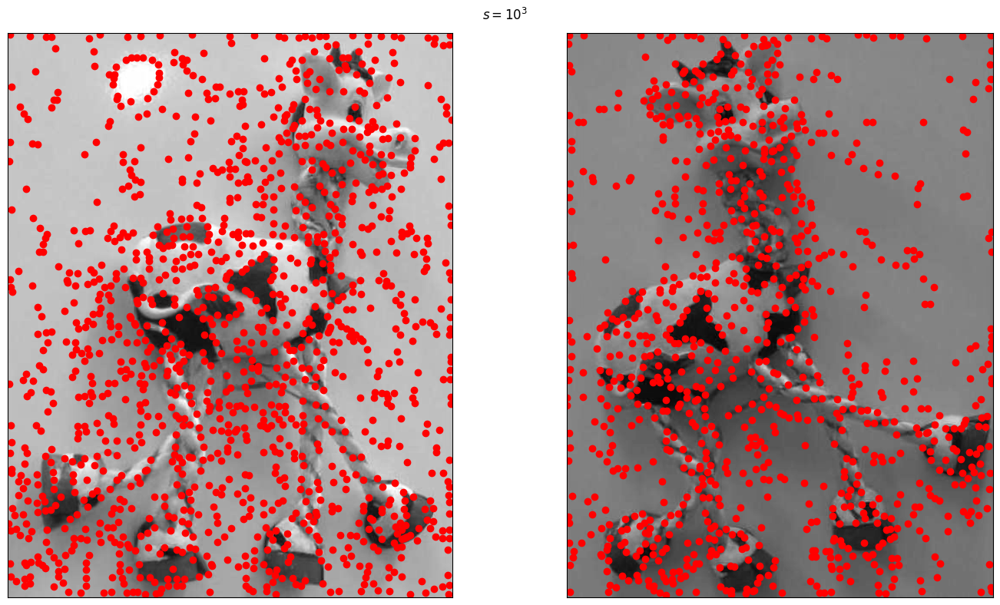

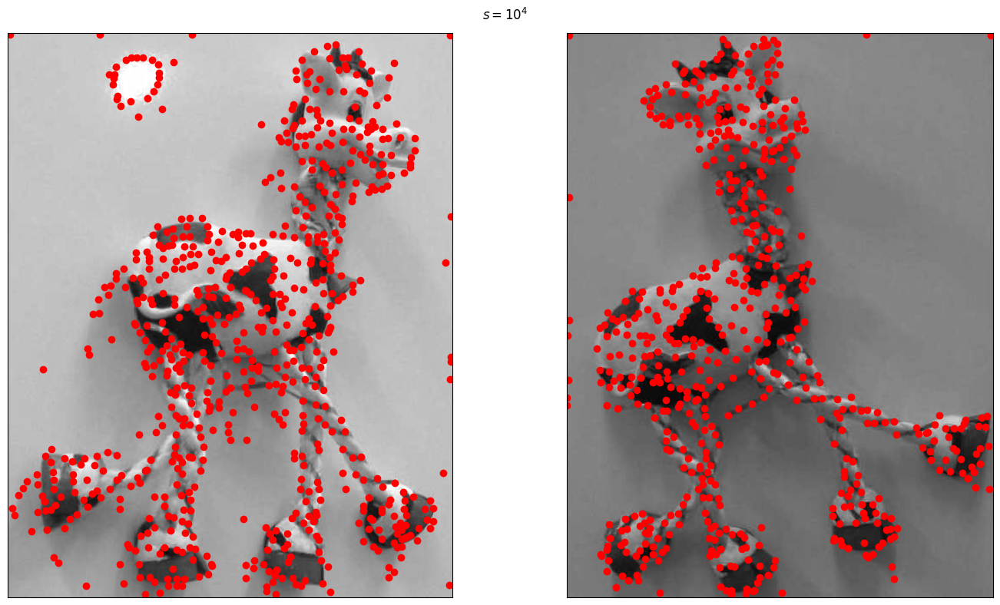

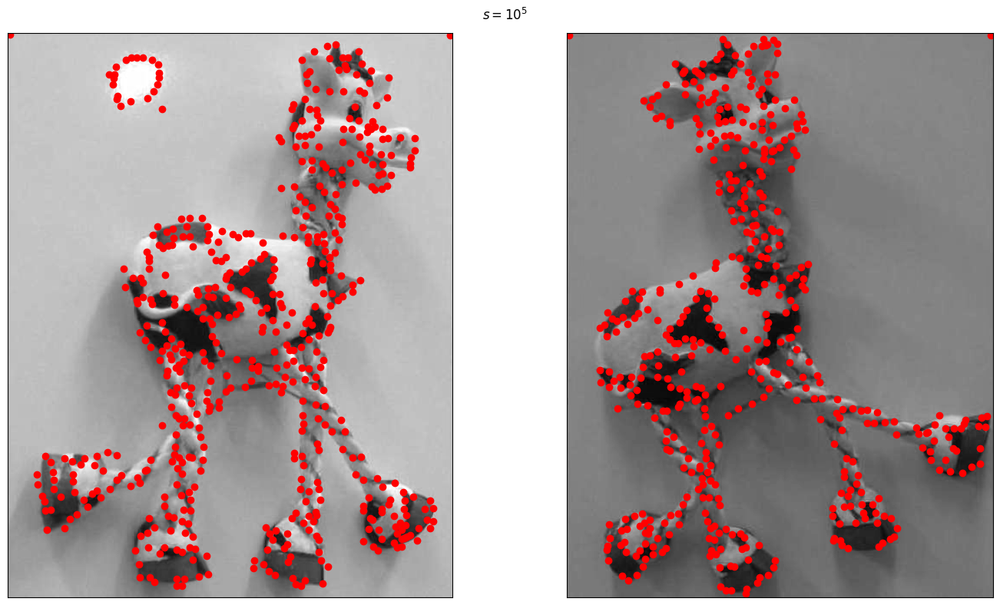

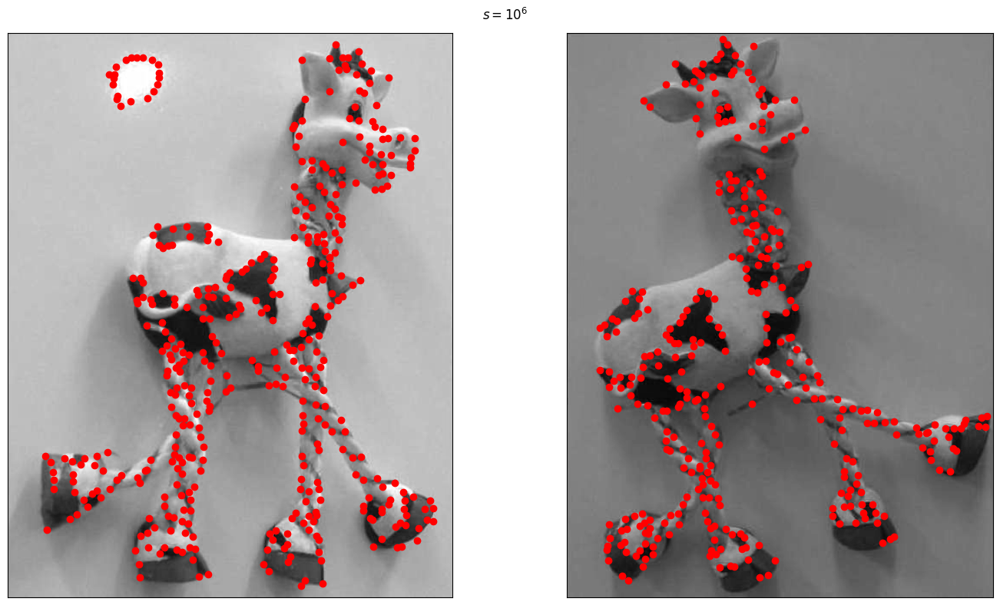

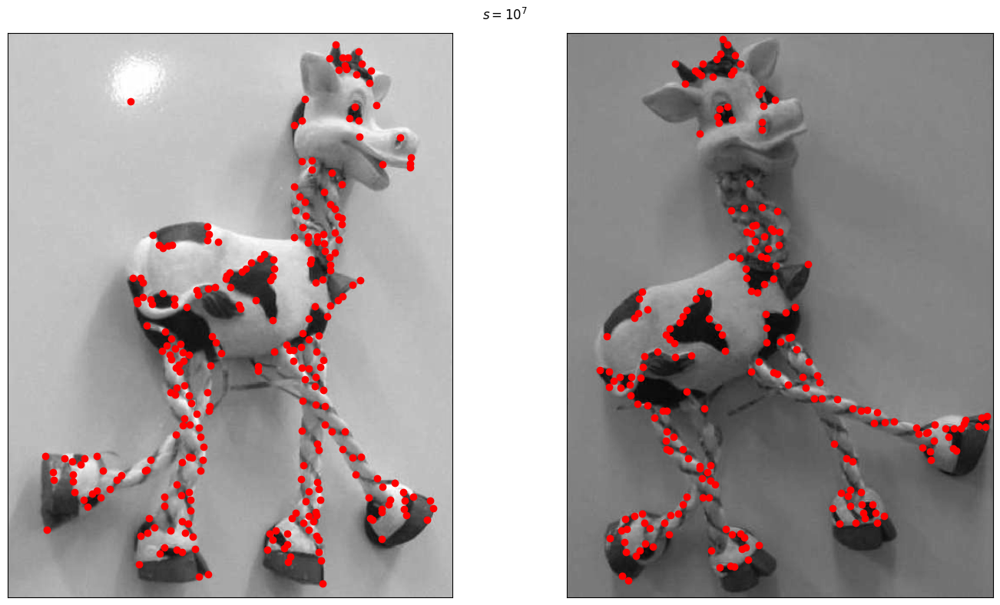

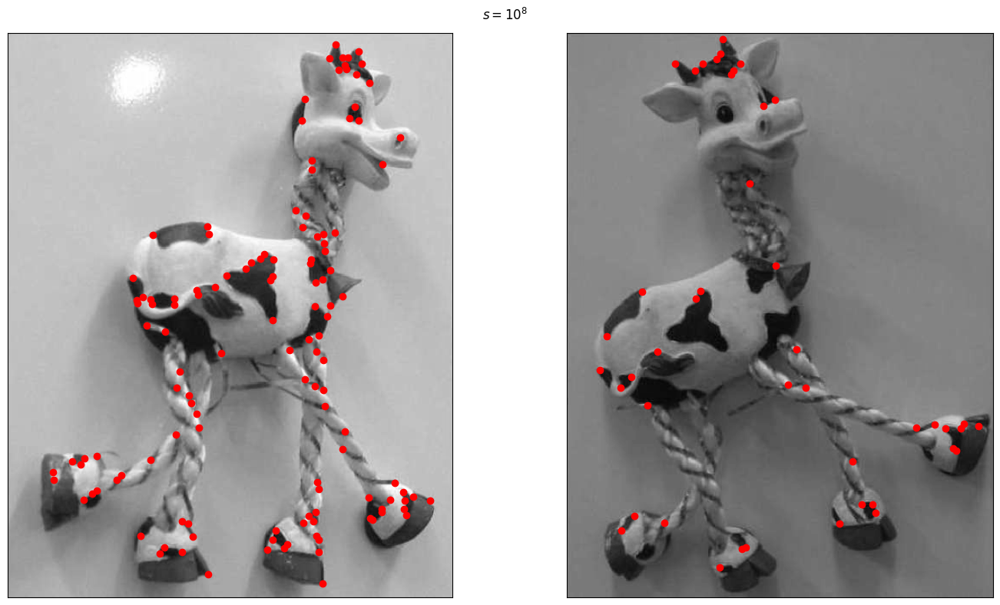

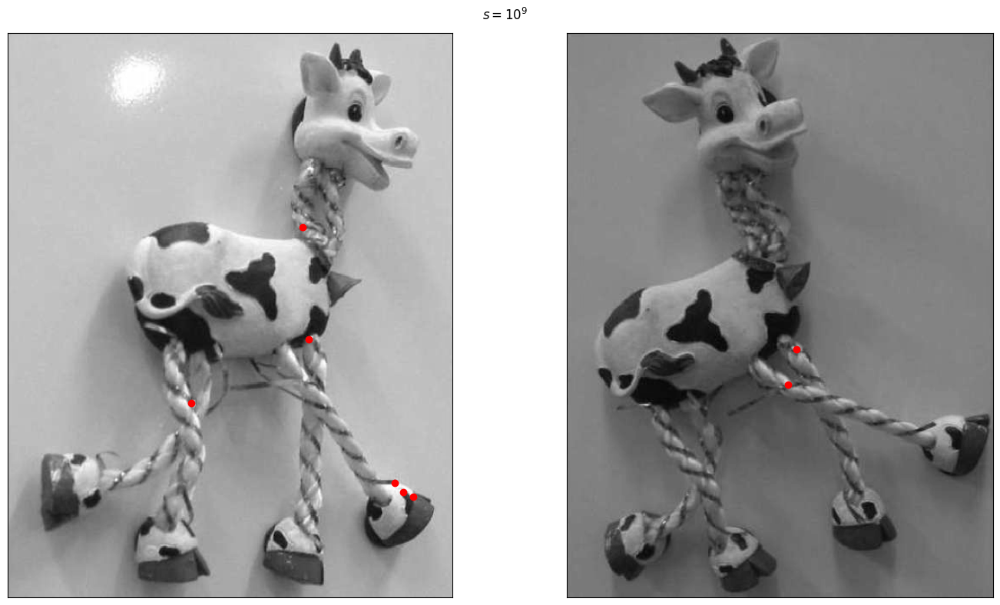

In [46]:
toyHorse1 = np.array(Image.open('img/toyHorse1.png'))
toyHorse2 = np.array(Image.open('img/toyHorse2.png'))

for i in range(3, 10):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))
    fig.suptitle("$s=10^{:}$".format(i))
    ax[0].imshow(toyHorse1, cmap="gray")
    ax[0].set_xticks(())
    ax[0].set_yticks(())
    y, x = np.nonzero(cornerDetector(toyHorse1, 2.1, 0.04, 10**i))
    ax[0].scatter(x, y, c="red")

    ax[1].imshow(toyHorse2, cmap="gray")
    ax[1].set_xticks(())
    ax[1].set_yticks(())
    y, x = np.nonzero(cornerDetector(toyHorse2, 2.1, 0.04, 10**i))
    ax[1].scatter(x, y, c="red")
    fig.tight_layout()
    plt.show()

La meilleure valeur de seuil pour ```toyHourse1``` et ```toyHourse2``` semble être $s=10^8$.

2) What are the dynamic ranges of these two images ?

toyHorse1 from  1  to  255 , dynamic range :  254
toyHorse2 from  0  to  253 , dynamic range :  253


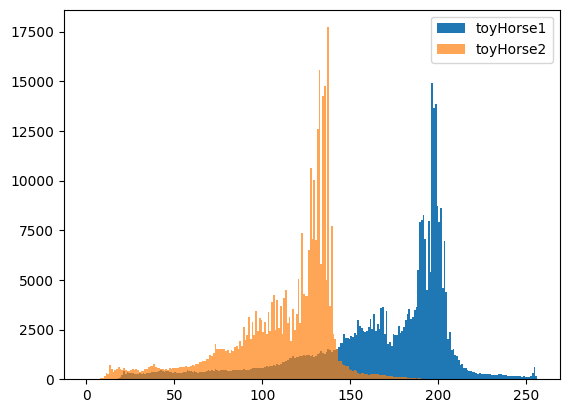

In [47]:
print("toyHorse1 from ", toyHorse1.min(), " to ", toyHorse1.max(), ", dynamic range : ", toyHorse1.max()-toyHorse1.min())
print("toyHorse2 from ", toyHorse2.min(), " to ", toyHorse2.max(), ", dynamic range : ", toyHorse2.max()-toyHorse2.min())

plt.hist(toyHorse1.ravel(), 256, [0,256], label="toyHorse1")
plt.hist(toyHorse2.ravel(), 256, [0,256], alpha=0.7, label="toyHorse2")
plt.legend()
plt.show()

Ces images couvrent des plages dynamiques comparables. En parlant de puissances de 2, cela signifie que les deux images ont été codées dans une plage de $[0,256[$, puisqu'elles sont des images $8$ -bits $(2^8=256)$. On remarque que l'image de toyHorse1 est plus lumineuse que toyHorse2, qu'on peut aussi voir dans l'histogramme affiché.

3) What are the transformations beetween the two images ?

En plus de luminosité, les deux images diffèrent par une rotation et un angle de vue.

4) Using a fixed threshold, is the detection invariant to rotation ? To affine transformation of brightness ?

In [51]:
def affiche(img1, img2, title):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))
    fig.suptitle(title)
    ax[0].imshow(img1, cmap="gray")
    ax[0].set_xticks(())
    ax[0].set_yticks(())
    y, x = np.nonzero(cornerDetector(img1, 2.1, 0.04, 10**7))
    ax[0].scatter(x, y, c="red")

    ax[1].imshow(img2, cmap="gray")
    ax[1].set_xticks(())
    ax[1].set_yticks(())
    y, x = np.nonzero(cornerDetector(img2, 2.1, 0.04, 10**7))
    ax[1].scatter(x, y, c="red")
    fig.tight_layout()
    plt.show()

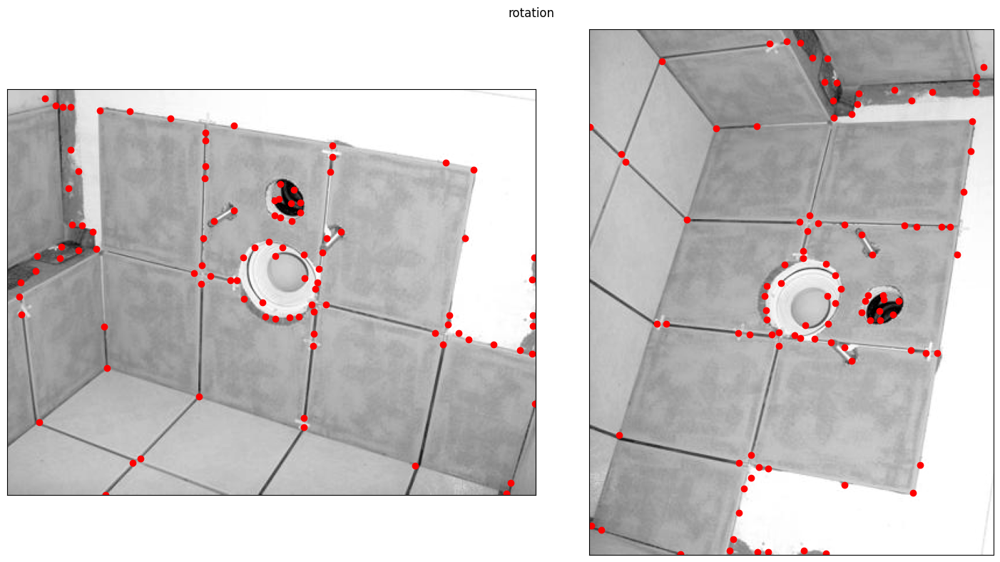

In [57]:
# rotation
carrelage_wiki = np.array(Image.open('img/carrelage_wikipedia.jpg'))
rotated = np.rot90(carrelage_wiki, 3)
affiche(carrelage_wiki, rotated, "rotation")

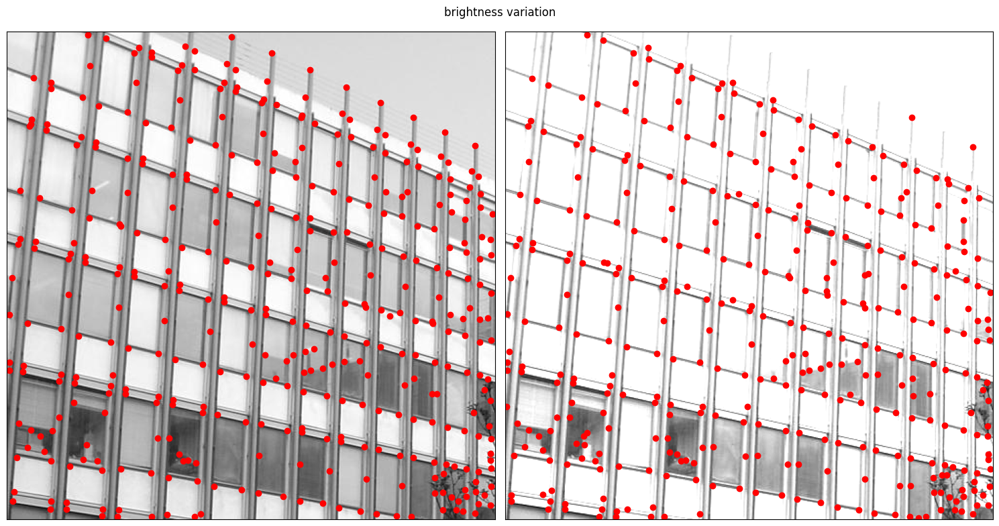

In [64]:
# transformation affine d'intensité
from PIL import ImageEnhance
jussieu = Image.open('img/Jussieu_wikipedia.jpg')
enhanced = ImageEnhance.Brightness(jussieu)
darkened = enhanced.enhance(1.5) # facteur
affiche(jussieu, darkened, "brightness variation")

- $\textbf{L'invariance par rotation}$

Nous avons : 
$$ E^1_{u,v} = (u,v)M(u,v)^T$$
Soit $P$ la matrice de rotation, nous pouvons appliquer une rotation à la matrice $M$: $$M' = P^TMP$$
Or : $$E^1_{u,v} = (u,v)M'(u,v)^T = (u,v)P^TMP(u,v)^T$$

$det(P)=det(P^T)=1$, alors $det(M')=det(P^TMP)=det(P^T)det(M)det(P)=det(M)$.
De même, la trace de $M$ reste inchangée sous rotation car $trace(M')=trace(P^TMP)=trace(MPP^T)=trace(M)$.

Cela veut dire que le détecteur de Harris est invariant à la rotation (car la réponse de Harris $R$ de détecteur reste inchangée).



- $\textbf{L'invariance par une transformation affine d'intensité(de luminosité)}$
$I'(x,y) = aI(x,y)+b$ avec $a,b \in \mathbb{R}$


Étant donné que $a$ impacte la façon dont les niveaux s'étalent (c'est-à-dire le contraste), augmenter ou diminuer la luminosité d'une image signifie avoir $a=1$ et $b \in \mathbb{R}$. Ainsi, nous aurons $I′(x,y)=I(x,y)+b$. En prenant les dérivées partielles et étant donné que $b$ est une constante : $Ix′=Ix$​ et $Iy′=Iy$.
Comme les transformations affines de la luminosité (augmentation ou diminution de la luminosité=l'ajout d'une constante) n'affectent pas les gradients de l'image, le détecteur de Harris reste inchangé(les éléments de la matrice $M$ restent inchangés tout comme la réponse $R$ du détecteur de Harris). 